## Connect Drive

In [2]:
!git clone https://github.com/faheemkhaskheli9/speech_separation.git

Cloning into 'speech_separation'...
remote: Enumerating objects: 370, done.
remote: Total 370 (delta 0), reused 0 (delta 0), pack-reused 370
Receiving objects: 100% (370/370), 31.28 MiB | 18.02 MiB/s, done.
Resolving deltas: 100% (168/168), done.


In [ ]:
%cd /content/speech_separation/data/audio/catalog
!gdown --id 1DddmXmJdLqYXz4kvX9ZehR3fC9gjbjOA
!gdown --id 1NIHbuGRQg5Y78T4nyIU7U4Qg52TBjRKv
%cd /content/speech_separation

Downloading...
From: https://drive.google.com/uc?id=1DddmXmJdLqYXz4kvX9ZehR3fC9gjbjOA
To: /content/avspeech_test.csv
100% 9.41M/9.41M [00:00<00:00, 27.0MB/s]
Access denied with the following error:

 	Cannot retrieve the public link of the file. You may need to change
	the permission to 'Anyone with the link', or have had many accesses. 

You may still be able to access the file from the browser:

	 https://drive.google.com/uc?id=1NIHbuGRQg5Y78T4nyIU7U4Qg52TBjRKv 

/content/speech_separation


# go to project folder

### intsall packages needed

In [5]:
!pip install mtcnn youtube-dl
!apt-get install libsox-fmt-all libsox-dev sox
!yes | pip uninstall tensorflow==2.2.0
!pip install tensorflow==1.15.0
!pip install bert-tensorflow
!pip install 'h5py==2.10.0' --force-reinstall
!pip install  keras==2.2.4 

     |████████████████████████████████| 2.3 MB 15.0 MB/s 
     |████████████████████████████████| 1.9 MB 53.1 MB/s 
Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  libao-common libao4 libid3tag0 libmad0 libmagic-mgc libmagic1
  libopencore-amrnb0 libopencore-amrwb0 libsox-fmt-alsa libsox-fmt-ao
  libsox-fmt-base libsox-fmt-mp3 libsox-fmt-oss libsox-fmt-pulse libsox3
Suggested packages:
  libaudio2 file
The following NEW packages will be installed:
  libao-common libao4 libid3tag0 libmad0 libmagic-mgc libmagic1
  libopencore-amrnb0 libopencore-amrwb0 libsox-dev libsox-fmt-all
  libsox-fmt-alsa libsox-fmt-ao libsox-fmt-base libsox-fmt-mp3 libsox-fmt-oss
  libsox-fmt-pulse libsox3 sox
0 upgraded, 18 newly installed, 0 to remove and 39 not upgraded.
Need to get 1,267 kB of archives.
After this operation, 9,153 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubunt

     |████████████████████████████████| 312 kB 14.2 MB/s 
  Attempting uninstall: keras
    Found existing installation: keras 2.8.0
    Uninstalling keras-2.8.0:
      Successfully uninstalled keras-2.8.0


In [ ]:
/content/speech_separation/model/lib/MyGenerator.py    change  1792 to 171

In [13]:
%cd /content/speech_separation
import glob
import librosa
import numpy as np
import scipy.io.wavfile as wavfile

from model.lib import utils
import itertools
import time
import random
import math
from mtcnn.mtcnn import MTCNN
import cv2
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function
import sys
import datetime
import pandas as pd
import os
# from data.lib import AVHandler as avh
import tensorflow as tf
from tensorflow.python.framework import tensor_util
from keras.models import load_model
from keras.models import Model
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from keras import optimizers
from keras.models import Sequential, model_from_json
from keras import optimizers
from keras.layers import Input, Dense, Convolution2D, Bidirectional, UpSampling2D, UpSampling3D, concatenate
from keras.layers import Dropout, Flatten, BatchNormalization, ReLU, Reshape, Permute, Lambda, TimeDistributed
from keras.models import Model, load_model 
from keras.layers.recurrent import LSTM
from keras.initializers import he_normal, glorot_uniform
from keras.callbacks import ModelCheckpoint, LearningRateScheduler, Callback
from keras.callbacks import TensorBoard
# from model.lib.MyGenerator import AVGenerator
# from model.lib.model_ops import ModelMGPU,latest_file
from keras import optimizers
# from model.lib.model_loss import audio_discriminate_loss2 as audio_loss

/content/speech_separation


### Dataset Path

In [ ]:
cat_train = pd.read_csv('/content/speech_separation/data/audio/catalog/avspeech_train.csv')
cat_train.columns = ['link','start_time','end_time','pos_x','pos_y']
cat_train.values.shape

(2621844, 5)

In [ ]:
cat_train = pd.read_csv('/content/avspeech_test.csv')
cat_train.columns = ['link','start_time','end_time','pos_x','pos_y']
cat_train.values.shape

(183272, 5)

## Dataset Samples


In [ ]:
# range for our dataset to be used
data_range = (1,20) # start index and ending index
## in data range last index is inclusive

# Step 2 - download audio

In [ ]:
import os
import librosa
import scipy.io.wavfile as wavfile
import numpy as np
# A file for downloading files and handling audio and video 

# command line functions #


def mkdir(dir_name,loc=''):
    # make directory use command line
    # dir_name  | name of the directory
    # loc       | the location for the directory to be created
    command = ""
    if loc != '':
        command += "cd %s" % loc
    command += 'mkdir ' + dir_name
    os.system(command)

def m_link(youtube_id):
    # return the youtube actual link
    link = 'https://www.youtube.com/watch?v='+youtube_id
    return link

def download(loc,name,link,sr=16000,type='audio'):
    # download audio from the link
    # loc   | the location for downloaded file
    # name  | the name for the audio file
    # link  | the link to downloaded by youtube-dl
    # type  | the type of downloaded file


    if type == 'audio':
        # download wav file from the youtube link
        command = 'youtube-dl -x --audio-format wav -o o' + name + '.wav ' + link + ';'
        os.system(command)
        command = 'ffmpeg -i o%s.wav -ar %d -ac 1 %s.wav;' % (name,sr,loc+"/"+name)
        os.system(command)
        command = 'rm o%s.wav' % name
        os.system(command)


def cut(loc,name,start_time,end_time):
    # trim the audio/video by sox
    # loc         | the location of the file
    # name        | the name of file to trim
    # start_time  | the start time of the audio segment
    # end_time    | the end time of the audio segment
    length = end_time - start_time
    new_name = loc+"/"+name
    new_trim_name = loc+"/trim_"+name
    command = 'sox %s.wav %s.wav trim %s %s;' % (new_name,new_trim_name,start_time,length)
    os.system(command)
    command = 'rm %s.wav' % new_name
    os.system(command)


def conc(loc,name,trim_clean=False):
    # concatenate the data in the loc (trim*.wav)
    command = 'cd %s;' % loc
    command += 'sox --combine concatenate trim_*.wav -o %s.wav;' % name
    if trim_clean:
    	command += 'rm trim_*.wav;'
    os.system(command)


def mix(loc,name,file1,file2,start,end,trim_clean=False):
    # mix the audio/video via sox
    # loc         | location of the mix files
    # name        | output name of wav
    # file1       | first file to mix
    # file2       | second file to mix
    # start       | mixture starting time
    # end         | mixture end time
    # trim_clean  | delete the trim file or not
    command = 'cd %s;' % loc
    cut(loc,file1,start,end)
    cut(loc,file2,start,end)
    trim1 = '%s/trim_%s.wav' % (loc,file1)
    trim2 = '%s/trim_%s.wav' % (loc,file2)
    with open(trim1, 'rb') as f:
        wav1, wav1_sr = librosa.load(trim1, sr=None)  # time series data,sample rate
    with open(trim2, 'rb') as f:
        wav2, wav2_sr = librosa.load(trim2, sr=None)

    # compress the audio to same volume level
    wav1 = wav1 / np.max(wav1)
    wav2 = wav2 / np.max(wav2)
    assert wav1_sr == wav2_sr
    mix_wav = wav1*0.5+wav2*0.5

    path = '%s/%s.wav' % (loc,name)
    wavfile.write(path,wav1_sr,mix_wav)
    if trim_clean:
        command += 'rm trim_%s.wav;rm trim_%s.wav;' % (file1,file2)
    os.system(command)


In [ ]:
# Before running, make sure avspeech_train.csv and avspeech_test.csv are in catalog.
# if not, see the requirement.txt
# download and preprocess the data from AVspeech dataset

def m_link(youtube_id):
    # return the youtube actual link
    link = 'https://www.youtube.com/watch?v='+youtube_id
    return link

def m_audio(loc,name,cat,start_idx,end_idx):
    # make concatenated audio following by the catalog from AVSpeech
    # loc       | the location for file to store
    # name      | name for the wav mix file
    # cat       | the catalog with audio link and time
    # start_idx | the starting index of the audio to download and concatenate
    # end_idx   | the ending index of the audio to download and concatenate

    for i in range(start_idx,end_idx):
        
        f_name = name+str(i)
        link = m_link(cat.loc[i,'link'])
        start_time = cat.loc[i,'start_time']
        end_time = start_time + 3.0
        download(loc,f_name,link)
        cut(loc,f_name,start_time,end_time)
        print('\r',i,'/',end_idx,end='')

# create 80000-90000 audios data from 290K
mkdir('data/audio/audio_train')

start_time = time.time()
m_audio('data/audio/audio_train','audio_train',cat_train,data_range[0],data_range[1])
print( 'Time Taken', time.time() - start_time)

 19 / 20Time Taken 2460.5104978084564


# Step 3 - Normalize audio data

In [ ]:
RANGE = data_range

if(not os.path.isdir('data/audio/norm_audio_train')):
    os.mkdir('data/audio/norm_audio_train')

start_time = time.time()

for num in range(RANGE[0],RANGE[1]+1):
    path = './data/audio/audio_train/trim_audio_train%s.wav'% num
    norm_path = './data/audio/norm_audio_train/trim_audio_train%s.wav'% num
    if (os.path.exists(path)):
        audio,_= librosa.load(path,sr=16000)
        max = np.max(np.abs(audio))
        norm_audio = np.divide(audio,max)
        wavfile.write(norm_path,16000,norm_audio)

print( 'Time Taken', time.time() - start_time)

Time Taken 0.0075724124908447266


# Step 4 - Downlaod videos

In [ ]:
def video_download(loc,cat, v_name,start_idx,end_idx):
    # Only download the video from the link
    # loc        | the location for downloaded file
    # v_name     | the name for the video file
    # cat        | the catalog with audio link and time
    # start_idx  | the starting index of the video to download
    # end_idx    | the ending index of the video to download

    for i in range(start_idx,end_idx):
        command = 'cd %s;' % loc
        f_name = str(i)
        link = m_link(cat.loc[i, 'link'])
        start_time = cat.loc[i, 'start_time']
        end_time = start_time + 3.0
        start_time = datetime.timedelta(seconds=start_time)
        end_time = datetime.timedelta(seconds=end_time)
        command += 'ffmpeg -i $(youtube-dl -f ”mp4“ --get-url ' + link + ') ' + '-c:v h264 -c:a copy -ss %s -to %s %s.mp4' \
                % (start_time, end_time, f_name)
        #command += 'ffmpeg -i %s.mp4 -r 25 %s.mp4;' % (f_name,'clip_' + f_name) #convert fps to 25
        #command += 'rm %s.mp4' % f_name
        print(command)
        os.system(command)
        
        print('\r',i,'/',end_idx,end='')

def generate_frames(loc,start_idx,end_idx):
    # get frames for each video clip
    # loc        | the location of video clip
    # v_name     | v_name = 'clip_video_train'
    # start_idx  | the starting index of the training sample
    # end_idx    | the ending index of the training sample

    mkdir('data/video/frames')
    for i in range(start_idx, end_idx):
        command = 'cd %s;' % loc
        f_name = str(i)
        command += 'ffmpeg -i %s.mp4 -y -f image2  -vframes 75 ../video/frames/%s-%%02d.jpg' % (f_name, f_name)
        os.system(command)


def download_video_frames(loc,cat,start_idx,end_idx,rm_video):
    # Download each video and convert to frames immediately, can choose to remove video file
    # loc        | the location for downloaded file
    # cat        | the catalog with audio link and time
    # start_idx  | the starting index of the video to download
    # end_idx    | the ending index of the video to download
    # rm_video   | boolean value for delete video and only keep the frames

    mkdir('data/video/frames')
    for i in range(start_idx, end_idx + 1):
        command = 'cd %s;' % loc
        f_name = str(i)
        link = m_link(cat.loc[i, 'link'])
        start_time = cat.loc[i, 'start_time']
        end_time = start_time + 3.0
        start_time = datetime.timedelta(seconds=start_time)
        end_time = datetime.timedelta(seconds=end_time)
        command += 'ffmpeg -i $(youtube-dl -f ”mp4“ --get-url ' + link + ') ' + '-c:v h264 -c:a copy -ss %s -to %s %s.mp4;' \
                   % (start_time, end_time, f_name)
        #ommand += 'ffmpeg -i %s.mp4 -r 25 %s.mp4;' % (f_name, 'clip_' + f_name)  # convert fps to 25
        #command += 'rm %s.mp4;' % f_name

        #converts to frames
        #command += 'ffmpeg -i %s.mp4 -y -f image2  -vframes 75 ../frames/%s-%%02d.jpg;' % (f_name, f_name)
        command += 'ffmpeg -i %s.mp4 -vf fps=25 ../frames/%s-%%02d.jpg;' % (f_name, f_name)
        #command += 'ffmpeg -i %s.mp4 ../frames/%sfr_%%02d.jpg;' % ('clip_' + f_name, f_name)

        if rm_video:
            command += 'rm %s.mp4' % f_name
        os.system(command)
        #print(command)
        print('\r',i,'/',end_idx,end='')

mkdir('data/video/video_train')

# download video , convert to images separately
video_download(loc='video_train',v_name='video_train',cat=cat_train,start_idx=data_range[0],end_idx=data_range[1])
#avh.generate_frames(loc='video_train',v_name='clip_video_train',start_idx=2,end_idx=4)
# download each video and convert to frames immediately

start_time = time.time()
# download_video_frames(loc='data/video/video_train',cat=cat_train,start_idx=data_range[0],end_idx=data_range[1],rm_video=False)
print( 'Time Taken', time.time() - start_time)

cd video_train;ffmpeg -i $(youtube-dl -f ”mp4“ --get-url https://www.youtube.com/watch?v=akwvpAiLFk0) -c:v h264 -c:a copy -ss 0:02:24.680000 -to 0:02:27.680000 2.mp4
 2 / 4cd video_train;ffmpeg -i $(youtube-dl -f ”mp4“ --get-url https://www.youtube.com/watch?v=Swss72CHSWg) -c:v h264 -c:a copy -ss 0:01:30.023267 -to 0:01:33.023267 3.mp4
 3 / 4Time Taken 7.82012939453125e-05


In [ ]:
cat_train

,link,start_time,end_time,pos_x,pos_y
0,AvWWVOgaMlk,90.000000,93.566667,0.586719,0.311111
1,Y8HMIm8mdns,171.607767,174.607767,0.505729,0.240741
2,akwvpAiLFk0,144.680000,150.000000,0.698438,0.288889
3,Swss72CHSWg,90.023267,97.297200,0.230729,0.204630
4,ymD5uLlLc0g,36.033000,40.900000,0.341667,0.475926
...,...,...,...,...,...
2621839,Ki8M7q-jjq4,120.055044,124.664600,0.495312,0.456944
2621840,lI8yey-mlhM,54.654000,58.625000,0.507812,0.283333
2621841,IcL3dkz0RYc,109.566667,120.000000,0.467187,0.458333
2621842,xGrSQo3FAiA,137.996167,141.399567,0.746875,0.362500


In [ ]:
os.system("cd data/video/video_train;ffmpeg -i $(youtube-dl -f ”mp4“ --get-url https://www.youtube.com/watch?v=Y8HMIm8mdns) -c:v h264 -c:a copy -ss 0:02:51.607767 -to 0:02:54.607767 1.mp4;ffmpeg -i 1.mp4 -vf fps=25 ../frames/1-%02d.jpg;")

256

# Step 5 - detect face

In [ ]:
frame_path = './data/video/frames/'
output_dir = './data/video/face_input'

if not os.path.isdir('./data/video/face_input'):
    os.mkdir('./data/video/face_input')

def bounding_box_check(faces,x,y):
    # check the center
    for face in faces:
        bounding_box = face['box']
        if(bounding_box[1]<0):
            bounding_box[1] = 0
        if(bounding_box[0]<0):
            bounding_box[0] = 0
        if(bounding_box[0]-50>x or bounding_box[0]+bounding_box[2]+50<x):
            print('change person from')
            print(bounding_box)
            print('to')
            continue
        if (bounding_box[1]-50 > y or bounding_box[1] + bounding_box[3]+50 < y):
            print('change person from')
            print(bounding_box)
            print('to')
            continue
        return bounding_box

def face_detect(file,detector,frame_path=frame_path,cat_train=cat_train):
    name = file.replace('.jpg', '').split('-')
    log = cat_train.iloc[int(name[0])]
    x = log['pos_x']
    y = log['pos_y']

    img = cv2.imread('%s%s'%(frame_path,file))
    x = img.shape[1] * x
    y = img.shape[0] * y
    faces = detector.detect_faces(img)
    # check if detected faces
    if(len(faces)==0):
        print('no face detect: '+file)
        return #no face
    bounding_box = bounding_box_check(faces,x,y)
    if(bounding_box == None):
        print('face is not related to given coord: '+file)
        return
    print(file," ",bounding_box)
    print(file," ",x, y)
    crop_img = img[bounding_box[1]:bounding_box[1] + bounding_box[3],bounding_box[0]:bounding_box[0]+bounding_box[2]]
    crop_img = cv2.resize(crop_img,(160,160))
    cv2.imwrite('%s/frame_'%output_dir + name[0] + '_' + name[1] + '.jpg', crop_img)
    #crop_img = cv2.cvtColor(crop_img, cv2.COLOR_BGR2RGB)
    #plt.imshow(crop_img)
    #plt.show()


start_time = time.time()
detector = MTCNN()
for i in range(data_range[0],data_range[1]+1):
    for j in range(1,76):
        file_name = "%d-%02d.jpg"%(i, j)
        if (not os.path.exists('%s%s' % (frame_path, file_name))):
            print('cannot find input: ' + '%s%s' % (frame_path, file_name))
            continue
        face_detect(file_name, detector)

print( 'Time Taken', time.time() - start_time)

### valid or not valid frame

In [ ]:
inspect_dir = 'data/video/face_input'
inspect_range = data_range
valid_frame_path = 'data/video/valid_frame.txt'

with open(valid_frame_path,'w+') as f:
  pass

def check_frame(idx,part,dir=inspect_dir):
    path = dir + "/frame_%d_%02d.jpg"%(idx,part)
#    print(path)
    if(not os.path.exists(path)): return False
    return True

start_time = time.time()
for i in range(inspect_range[0],inspect_range[1]+1):
    valid = True
#    print('processing frame %s'%i)
    for j in range(1,76):
        if(check_frame(i,j)==False):
            path = inspect_dir + "/frame_%d_*.jpg"% i
            #for file in glob.glob(path):
            #    os.remove(file)
            valid = False
            print('frame %s is not valid'%i,j)
            break
    if valid:
        with open(valid_frame_path,'a') as f:
            frame_name = "frame_%d"%i
            f.write(frame_name+'\n')
            print(frame_name)

print( 'Time Taken', time.time() - start_time)

# Step 6 - Create audio database

In [ ]:
data_range[1]*4 

400

In [ ]:
# Parameter
SAMPLE_RANGE = data_range # data usage to generate database
WAV_REPO_PATH = os.path.expanduser("./data/audio/norm_audio_train")
DATABASE_REPO_PATH = './data/audio/AV_model_database'
FRAME_LOG_PATH = './data/video/valid_frame.txt'
NUM_SPEAKER = 2
MAX_NUM_SAMPLE = data_range[1]*4

# time measure decorator
def timit(func):
    def cal_time(*args,**kwargs):
        tic = time.time()
        result = func(*args,**kwargs)
        tac = time.time()
        print(func.__name__,'running time: ',(tac-tic),'ms')
        return result
    return cal_time

# create directory to store database
def init_dir(path = DATABASE_REPO_PATH ):
    if not os.path.isdir(path):
        os.mkdir(path)

    if not os.path.isdir('%s/mix'%path):
        os.mkdir('%s/mix'%path)

    if not os.path.isdir('%s/single'%path):
        os.mkdir('%s/single'%path)

    if not os.path.isdir('%s/crm'%path):
        os.mkdir('%s/crm'%path)

    if not os.path.isdir('%s/mix_wav'%path):
        os.mkdir('%s/mix_wav'%path)

@timit
def generate_path_list(sample_range=SAMPLE_RANGE,repo_path=WAV_REPO_PATH,frame_path=FRAME_LOG_PATH):
    '''

    :param sample_range:
    :param repo_path:
    :return: 2D array with idx and path (idx_wav,path_wav)
    '''
    audio_path_list = []
    frame_set = set()
    
    with open(frame_path,'r') as f:
        frames = f.readlines()
    
    for i in range(len(frames)):
        frame = frames[i].replace('\n','').replace('frame_','')
        frame_set.add(int(frame))
    
    for i in range(sample_range[0],(sample_range[1]+1)):
        print('\rchecking...%d'%int(frame),end='')
        path = repo_path + '/trim_audio_train%d.wav'%i
        if os.path.exists(path) and (i in frame_set):
            audio_path_list.append((i,path))
    print('\nlength of the path list: ',len(audio_path_list))
    return audio_path_list

# data generate function
def single_audio_to_npy(audio_path_list,database_repo=DATABASE_REPO_PATH,fix_sr=16000):
    for idx,path in audio_path_list:
        print('\rsingle npy generating... %d'%((idx/len(audio_path_list))*100),end='')
        data, _ = librosa.load(path, sr=fix_sr)
        data = utils.fast_stft(data)
        name = 'single-%05d'%idx
        with open('%s/single_TF.txt'%database_repo,'a') as f:
            f.write('%s.npy'%name)
            f.write('\n')
        np.save(('%s/single/%s.npy'%(database_repo,name)),data)
    print()


# split single TF data to different part in order to mix
def split_to_mix(audio_path_list,database_repo=DATABASE_REPO_PATH,partition=2):
    # return split_list : (part1,part2,...)
    # each part : (idx,path)
    length = len(audio_path_list)
    part_len = length // partition
    head = 0
    part_idx = 0
    split_list = []
    print('length = ',length,', parts = ',part_len)
    if part_len == 0:
      part_len = 1
    while((head+part_len)<=length):
        part = audio_path_list[head:(head+part_len)]
        split_list.append(part)
        with open('%s/single_TF_part%d.txt'%(database_repo,part_idx),'a') as f:
            for idx, _ in part:
                name = 'single-%05d' % idx
                f.write('%s.npy' % name)
                f.write('\n')
                print('\r',idx, end='')
        head += part_len
        part_idx += 1
    print('done')
    return split_list

# mix single TF data
def all_mix(split_list,database_repo=DATABASE_REPO_PATH,partition=2): 

    print(len(split_list))
    assert len(split_list) == partition
    print('mixing data...')
    num_mix = 1
    num_mix_check = 0
    for part in split_list:
        num_mix *= len(part)
    print ('number of mix data; ',num_mix)

    part_len = len(split_list[-1])
    idx_list = [x for x in range(part_len)]
    combo_idx_list = itertools.product(idx_list,repeat=partition)
    for combo_idx in combo_idx_list:
        num_mix_check +=1
        single_mix(combo_idx,split_list,database_repo)
        print('\rnum of completed mixing audio : %d'%num_mix_check,end='')  
    print()
# mix several wav file and store TF domain data with npy
def single_mix(combo_idx,split_list,database_repo):
    assert len(combo_idx) == len(split_list)
    mix_rate = 1.0 / float(len(split_list))
    wav_list = []
    prefix = "mix"
    mid_name = ""

    for part_idx in range(len(split_list)):
        idx,path = split_list[part_idx][combo_idx[part_idx]]
        wav, _ = librosa.load(path, sr=16000)
        wav_list.append(wav)
        mid_name += '-%05d' % idx

    # mix wav file
    mix_wav = np.zeros_like(wav_list[0])
    for wav in wav_list:
        mix_wav += wav * mix_rate

    # save mix wav file
    wav_name = prefix+mid_name+'.wav'
    wavfile.write('%s/mix_wav/%s'%(database_repo,wav_name),16000,mix_wav)

    # transfer mix wav to TF domain
    F_mix = utils.fast_stft(mix_wav)
    name = prefix+mid_name+".npy"
    store_path = '%s/mix/%s'%(database_repo,name)

    # save mix as npy file
    np.save(store_path,F_mix)

    # save mix log
    with open('%s/mix_log.txt'%database_repo,'a') as f:
        f.write(name)
        f.write("\n")


def all_crm(mix_log_path,database_repo=DATABASE_REPO_PATH):
    with open(mix_log_path,'r') as f:
        mix_list = f.read().splitlines()

    for mix in mix_list:
        mix_path = '%s/mix/%s' % (database_repo, mix)
        mix = mix.replace(".npy","")
        mix = mix.replace("mix-","")
        idx_str_list = mix.split("-")
        single_crm(idx_str_list,mix_path,database_repo)

def single_crm(idx_str_list,mix_path,database_repo):
    F_mix = np.load(mix_path)
    mid_name = ""
    mix_name = "mix"
    dataset_line = ""

    for idx in idx_str_list:
        mid_name += "-%s"%idx
        mix_name += "-%s"%idx
    mix_name += '.npy'
    dataset_line += mix_name

    for idx in idx_str_list:
        single_name = 'single-%s.npy'%idx
        path = '%s/single/%s'%(database_repo,single_name)
        F_single = np.load(path)
        cRM = utils.fast_cRM(F_single,F_mix)

        last_name = '-%s'%idx
        cRM_name = 'crm' + mid_name + last_name + '.npy'

        # save crm to npy
        store_path = '%s/crm/%s'%(database_repo,cRM_name)
        np.save(store_path,cRM)

        # save crm information to log
        with open('%s/crm_log.txt'%database_repo, 'a') as f:
            f.write(cRM_name)
            f.write('\n')
        dataset_line += (" "+cRM_name)

    # write in database log
    with open('%s/dataset.txt'%database_repo,'a') as f:
        f.write(dataset_line)
        f.write('\n')


def train_test_split(dataset_log_path,data_range=[0,50000],test_ratio=0.1,shuffle=True,database_repo=DATABASE_REPO_PATH):
    with open(dataset_log_path,'r') as f:
        data_log = f.read().splitlines()

    if data_range[1]> len(data_log):
        data_range[1] = len(data_log)-1
    samples = data_log[data_range[0]:data_range[1]]
    if shuffle:
        random.shuffle(samples)

    length = len(samples)
    mid = int(math.floor(test_ratio*length))
    test = samples[:mid]
    train = samples[mid:]

    with open('%s/dataset_train.txt'%database_repo,'a') as f:
        for line in train:
            f.write(line)
            f.write('\n')

    with open('%s/dataset_val.txt' % database_repo, 'a') as f:
        for line in test:
            f.write(line)
            # print(line)
            f.write('\n')


if __name__ == "__main__":
    init_dir()
    audio_path_list = generate_path_list()
    print('\nsingle audio to npy')
    single_audio_to_npy(audio_path_list)

    print('\nsplit to mix')
    start_time = time.time()
    split_list = split_to_mix(audio_path_list,partition=NUM_SPEAKER)
    print( time.time() - start_time )

    print('\nall mix')
    start_time = time.time()
    all_mix(split_list,partition=NUM_SPEAKER)
    print( time.time() - start_time )

    print('\nall crm')
    start_time = time.time()
    mix_log_path = '%s/mix_log.txt'%DATABASE_REPO_PATH
    all_crm(mix_log_path)
    print( time.time() - start_time )

    print('\ntrain test split')
    start_time = time.time()
    dataset_log_path ='%s/dataset.txt'%DATABASE_REPO_PATH
    train_test_split(dataset_log_path,data_range=[0,MAX_NUM_SAMPLE])
    print( time.time() - start_time )


checking...99
length of the path list:  46
generate_path_list running time:  0.03373122215270996 ms

single audio to npy
single npy generating... 215

split to mix
length =  46 , parts =  23
 99done
0.007384061813354492

all mix
2
mixing data...
number of mix data;  529
num of completed mixing audio : 529
3.3175597190856934

all crm
26.837701559066772

train test split
0.0023932456970214844


In [ ]:
p=np.load('/content/speech_separation/data/audio/AV_model_database/crm/crm-00002-00044-00002.npy')
p.shape

(298, 257, 2)

# Step 7 - Generate log file for data generator

create AVdataset_train.txt

In [ ]:
with open('./data/audio/AV_model_database/dataset_train.txt', 'r') as t:
    lines = t.readlines()
    print(len(lines))
    for line in lines:
        info = line.strip().split('.')
        num1 = info[0].strip().split('-')[1]
        num2 = info[0].strip().split('-')[2]

        newline = line.strip() + ' ' + num1 + '_face_emb.npy' + ' ' + num2 + '_face_emb.npy\n'
        # print(newline)
        with open('./data/AV_log/AVdataset_train.txt', 'a') as f:
            f.write(newline)

with open('./data/audio/AV_model_database/dataset_val.txt', 'r') as t:
    lines = t.readlines()
    print(len(lines))
    for line in lines:
        # print(line)
        info = line.strip().split('.')
        num1 = info[0].strip().split('-')[1]
        num2 = info[0].strip().split('-')[2]

        newline = line.strip() + ' ' + num1 + '_face_emb.npy' + ' ' + num2 + '_face_emb.npy\n'
        with open('./data/AV_log/AVdataset_val.txt', 'a') as f:
            f.write(newline)

720
80


In [ ]:
!gdown --id 1Z3oL2r8ARnUfzqmyYjRhDyKNQVxF8ymQ
!unzip /content/speech_separation/keras-facenet.zip
!gdown --id 1_HkQou2UfSPyQJ2lhYzKMhQx407PFKoS
!unzip /content/speech_separation/20180402-114759.zip
%cd /content/speech_separation/

Downloading...
From: https://drive.google.com/uc?id=1Z3oL2r8ARnUfzqmyYjRhDyKNQVxF8ymQ
To: /content/speech_separation/keras-facenet.zip
100% 170M/170M [00:01<00:00, 125MB/s]
Archive:  /content/speech_separation/keras-facenet.zip
  inflating: keras-facenet/weights/facenet_keras_weights.h5  
  inflating: keras-facenet/model/facenet_keras.h5  
Downloading...
From: https://drive.google.com/uc?id=1_HkQou2UfSPyQJ2lhYzKMhQx407PFKoS
To: /content/speech_separation/20180402-114759.zip
100% 192M/192M [00:01<00:00, 101MB/s]
Archive:  /content/speech_separation/20180402-114759.zip
   creating: 20180402-114759/
  inflating: 20180402-114759/model-20180402-114759.meta  
  inflating: 20180402-114759/20180402-114759.pb  
  inflating: 20180402-114759/model-20180402-114759.ckpt-275.data-00000-of-00001  
  inflating: 20180402-114759/model-20180402-114759.ckpt-275.index  
/content/speech_separation


In [ ]:
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()

Instructions for updating:
non-resource variables are not supported in the long term


In [8]:
!pip install mediapipe
import cv2
import numpy as np
import os
from matplotlib import pyplot as plt
import time
import mediapipe as mp
 


mp_holistic = mp.solutions.holistic # Holistic model
mp_drawing = mp.solutions.drawing_utils # Drawing utilities


def mediapipe_detection(image, model):
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # COLOR CONVERSION BGR 2 RGB
    image.flags.writeable = False                  # Image is no longer writeable
    results = model.process(image)                 # Make prediction
    image.flags.writeable = True                   # Image is now writeable 
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR) # COLOR COVERSION RGB 2 BGR
    return image, results


def draw_landmarks(image, results):
    mp_drawing.draw_landmarks(image, results.face_landmarks, mp_holistic.FACEMESH_TESSELATION) # Draw face connections
    mp_drawing.draw_landmarks(image, results.pose_landmarks, mp_holistic.POSE_CONNECTIONS) # Draw pose connections
    mp_drawing.draw_landmarks(image, results.left_hand_landmarks, mp_holistic.HAND_CONNECTIONS) # Draw left hand connections
    mp_drawing.draw_landmarks(image, results.right_hand_landmarks, mp_holistic.HAND_CONNECTIONS) # Draw right hand connections
    
def draw_styled_landmarks(image, results):
    # Draw face connections
    mp_drawing.draw_landmarks(image, results.face_landmarks, mp_holistic.FACEMESH_TESSELATION, 
                             mp_drawing.DrawingSpec(color=(80,110,10), thickness=1, circle_radius=1), 
                             mp_drawing.DrawingSpec(color=(80,256,121), thickness=1, circle_radius=1)
                             ) 
 
def extract_keypoints(results):
    face = np.array([[res.x, res.y, res.z] for res in results.face_landmarks.landmark]).flatten() if results.face_landmarks else np.zeros(468*3)
    return np.concatenate([face])
 



import cv2
import mediapipe as mp
import numpy as np
# mp_drawing = mp.solutions.drawing_utils
mp_drawing_styles = mp.solutions.drawing_styles
# mp_face_mesh = mp.solutions.face_mesh

mp_holistic = mp.solutions.holistic # Holistic model
mp_drawing = mp.solutions.drawing_utils # Drawing utilities


import pandas as pd
from scipy.signal import savgol_filter
def my_filter(x):
    return savgol_filter(x, 11, 1)


# For static images:
def keypoints(file):
    lips = [61, 185, 40, 39, 37, 267, 269, 270, 409, 291,375, 321, 405, 314, 84,181, 91, 146,0]
    drawing_spec = mp_drawing.DrawingSpec(thickness=1, circle_radius=1)
    with mp_holistic.Holistic(min_detection_confidence=0.5, min_tracking_confidence=0.5) as holistic:
        image = cv2.imread(file)
        face =np.zeros(1404)
        # Convert the BGR image to RGB before processing.
        try:
            image, results = mediapipe_detection(image, holistic)
            face = extract_keypoints(results)
        except:
            pass

 
    dist_vector=[]
    k=face
    for i in range(len(lips)):
        p1 = np.array([k[lips[i]*3], k[lips[i]*3+1],k[lips[i]*3+2]])

        for j in range(i+1,len(lips)):
            p2 = np.array([k[lips[j]*3], k[lips[j]*3+1],k[lips[j]*3+2]])
            squared_dist = np.sum((p1-p2)**2, axis=0)
            dist = np.sqrt(squared_dist)
            dist_vector.append(dist)
            
    dist_vector=np.array(dist_vector)
    dist_vector_normalized = (dist_vector - np.min(dist_vector))/np.ptp(dist_vector)


    # print(face)
    return np.array([dist_vector_normalized])
 

k=np.array(keypoints('/content/speech_separation/data/video/face_input/frame_10_01.jpg'))
print(k.shape)
print((1, 171))


     |████████████████████████████████| 32.7 MB 1.2 MB/s 
(1, 171)
(1, 171)


# Step 8 - Generate Face Embedding

download facenet model

In [9]:
start_time = time.time()
## parameter
HDF5 = 1

VALID_FRAME_LOG_PATH = './data/video/valid_frame.txt'
FACE_INPUT_PATH = './data/video/face_input/'

if HDF5:
    save_path = './data/video/face_emb/'
    if not os.path.exists(save_path):
        os.mkdir(save_path)
    lines = []
    with open(VALID_FRAME_LOG_PATH, 'r') as f:
        lines = f.readlines()

    for line in lines:
        embtmp = np.zeros((75, 1, 171))
        headname = line.strip()
        tailname = ''
        for i in range(1, 76):
            if i < 10:
                tailname = '_0{}.jpg'.format(i)
            else:
                tailname = '_' + str(i) + '.jpg'
            picname = headname + tailname
            I = mpimg.imread(FACE_INPUT_PATH + picname)
            I_np = np.array(I)
            I_np = I_np[np.newaxis, :, :, :]
            embtmp[i - 1, :] = keypoints(FACE_INPUT_PATH + picname)

        # print(embtmp.shape)
        people_index = int(line.strip().split('_')[1])
        npname = '{:05d}_face_emb.npy'.format(people_index)
        # print(npname)

        np.save(save_path + npname, embtmp)
        with open('./data/video/faceemb_dataset.txt', 'a') as d:
            d.write(npname + '\n')

print( 'Time Taken', time.time() - start_time)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: invalid value encountered in true_divide


Time Taken 698.0638854503632


In [ ]:
# !cp -R  /content/speech_separation/data/video/face_emb /content/drive/MyDrive/Xperi-Project/GoogleDataList/data/video/face_emb1

In [ ]:
# !cp -R  /content/drive/MyDrive/Xperi-Project/GoogleDataList/data/video/face_emb1 /content/speech_separation/data/video/face_emb 

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!rm -rf /content/speech_separation/data/

In [ ]:
# !cp -R  /content/speech_separation/data /content/drive/MyDrive/Xperi-Project/GoogleDataList/data

In [3]:
!cp -R /content/drive/MyDrive/Xperi-Project/GoogleDataList/data /content/speech_separation/

In [ ]:
%cd /content/speech_separation/
!pwd

/content/speech_separation
/content/speech_separation


In [ ]:
!pip3 uninstall keras-nightly
!pip3 uninstall -y tensorflow
!pip3 install keras==2.1.6
!pip3 install tensorflow==1.15.0
!pip3 install h5py==2.10.0

Found existing installation: tensorflow 1.15.0
Uninstalling tensorflow-1.15.0:
  Successfully uninstalled tensorflow-1.15.0
     |████████████████████████████████| 339 kB 14.7 MB/s 
  Attempting uninstall: keras
    Found existing installation: Keras 2.2.4
    Uninstalling Keras-2.2.4:
      Successfully uninstalled Keras-2.2.4


  Using cached tensorflow-1.15.0-cp37-cp37m-manylinux2010_x86_64.whl (412.3 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
kapre 0.3.7 requires tensorflow>=2.0.0, but you have tensorflow 1.15.0 which is incompatible.


In [ ]:
import glob
videoPath='/content/speech_separation/data/video/face_emb/*.npy'
files=(glob.glob(videoPath))
files.sort()

for i in files:
    print(np.load(i).shape)
# files

In [11]:
import numpy as np
import keras


class AudioGenerator(keras.utils.Sequence):
    'Generates data for Keras'
    def __init__(self, filename, database_dir_path, Xdim=(298, 257, 2), ydim=(298, 257, 2, 2), batch_size=4, shuffle=True):
        'Initialization'
        self.filename = filename
        self.Xdim = Xdim
        self.ydim = ydim
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.on_epoch_end()
        self.database_dir_path = database_dir_path

    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.filename) / self.batch_size))

    def __getitem__(self, index):
        'Generate one batch of data'
        # Generate indexes of the batch
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]

        # Find list
        filename_temp = [self.filename[k] for k in indexes]

        # Generate data
        X, y = self.__data_generation(filename_temp)

        return X, y

    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.filename))
        if self.shuffle:
            np.random.shuffle(self.indexes)

    def __data_generation(self, filename_temp):
        'Generates data containing batch_size samples'
        # Initialization
        X = np.empty((self.batch_size, *self.Xdim))
        y = np.empty((self.batch_size, *self.ydim))

        # Generate data
        for i, ID in enumerate(filename_temp):
            info = ID.strip().split(' ')
            X[i,] = np.load(self.database_dir_path+'/mix/' + info[0])

            for j in range(2):
                y[i, :, :, :, j] = np.load(self.database_dir_path+'/crm/' + info[j + 1])

        assert y[:,:,:,0] != y[:,:,:,1]
        return X, y


class AVGenerator(keras.utils.Sequence):
    'Generates data for Keras'
    def __init__(self, filename, database_dir_path, X1dim=(298, 257, 2), X2dim=(75, 1, 171, 2), ydim=(298, 257, 2, 2), batch_size=4, shuffle=True):
        'Initialization'
        self.filename = filename
        self.X1dim = X1dim
        self.X2dim = X2dim
        self.ydim = ydim
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.on_epoch_end()
        self.database_dir_path = database_dir_path

    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.filename) / self.batch_size))

    def __getitem__(self, index):
        'Generate one batch of data'
        # Generate indexes of the batch
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]

        # Find list
        filename_temp = [self.filename[k] for k in indexes]

        # Generate data
        [X1, X2], y = self.__data_generation(filename_temp)

        return [X1, X2], y

    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.filename))
        if self.shuffle:
            np.random.shuffle(self.indexes)

    def __data_generation(self, filename_temp):
        'Generates data containing batch_size samples'
        # Initialization
        X1 = np.empty((self.batch_size, *self.X1dim))
        X2 = np.empty((self.batch_size, *self.X2dim))
        y = np.empty((self.batch_size, *self.ydim))

        # Generate data
        for i, ID in enumerate(filename_temp):
            info = ID.strip().split(' ')
            X1[i, ] = np.load(self.database_dir_path+'audio/AV_model_database/mix/' + info[0])
            for j in range(2):
                y[i, :, :, :, j] = np.load(self.database_dir_path+'audio/AV_model_database/crm/' + info[j + 1])
                X2[i, :, :, :, j] = np.load(self.database_dir_path+'video/face_emb/' + info[j + 3])
                
        return [X1, X2], y





In [ ]:
def AV_model(people_num=2):
  def UpSampling2DBilinear(size):
      return Lambda(lambda x: tf.compat.v1.image.resize_bilinear(x, size, align_corners=True))

  def sliced(x, index):
      return x[:, :, :, index]

  # --------------------------- AS start ---------------------------
  audio_input = Input(shape=(298, 257, 2))
  print('as_0:', audio_input.shape)
  as_conv1 = Convolution2D(96, kernel_size=(1, 7), strides=(1, 1), padding='same', dilation_rate=(1, 1), name='as_conv1')(audio_input)
  as_conv1 = BatchNormalization()(as_conv1)
  as_conv1 = ReLU()(as_conv1)
  print('as_1:', as_conv1.shape)

  as_conv2 = Convolution2D(96, kernel_size=(7, 1), strides=(1, 1), padding='same', dilation_rate=(1, 1), name='as_conv2')(as_conv1)
  as_conv2 = BatchNormalization()(as_conv2)
  as_conv2 = ReLU()(as_conv2)
  print('as_2:', as_conv2.shape)

  as_conv3 = Convolution2D(96, kernel_size=(5, 5), strides=(1, 1), padding='same', dilation_rate=(1, 1), name='as_conv3')(as_conv2)
  as_conv3 = BatchNormalization()(as_conv3)
  as_conv3 = ReLU()(as_conv3)
  print('as_3:', as_conv3.shape)

  as_conv4 = Convolution2D(96, kernel_size=(5, 5), strides=(1, 1), padding='same', dilation_rate=(2, 1), name='as_conv4')(as_conv3)
  as_conv4 = BatchNormalization()(as_conv4)
  as_conv4 = ReLU()(as_conv4)
  print('as_4:', as_conv4.shape)

  as_conv5 = Convolution2D(96, kernel_size=(5, 5), strides=(1, 1), padding='same', dilation_rate=(4, 1), name='as_conv5')(as_conv4)
  as_conv5 = BatchNormalization()(as_conv5)
  as_conv5 = ReLU()(as_conv5)
  print('as_5:', as_conv5.shape)

  as_conv6 = Convolution2D(96, kernel_size=(5, 5), strides=(1, 1), padding='same', dilation_rate=(8, 1), name='as_conv6')(as_conv5)
  as_conv6 = BatchNormalization()(as_conv6)
  as_conv6 = ReLU()(as_conv6)
  print('as_6:', as_conv6.shape)

  as_conv7 = Convolution2D(96, kernel_size=(5, 5), strides=(1, 1), padding='same', dilation_rate=(16, 1), name='as_conv7')(as_conv6)
  as_conv7 = BatchNormalization()(as_conv7)
  as_conv7 = ReLU()(as_conv7)
  print('as_7:', as_conv7.shape)

  as_conv8 = Convolution2D(96, kernel_size=(5, 5), strides=(1, 1), padding='same', dilation_rate=(32, 1), name='as_conv8')(as_conv7)
  as_conv8 = BatchNormalization()(as_conv8)
  as_conv8 = ReLU()(as_conv8)
  print('as_8:', as_conv8.shape)

  as_conv9 = Convolution2D(96, kernel_size=(5, 5), strides=(1, 1), padding='same', dilation_rate=(1, 1), name='as_conv9')(as_conv8)
  as_conv9 = BatchNormalization()(as_conv9)
  as_conv9 = ReLU()(as_conv9)
  print('as_9:', as_conv9.shape)

  as_conv10 = Convolution2D(96, kernel_size=(5, 5), strides=(1, 1), padding='same', dilation_rate=(2, 2), name='as_conv10')(as_conv9)
  as_conv10 = BatchNormalization()(as_conv10)
  as_conv10 = ReLU()(as_conv10)
  print('as_10:', as_conv10.shape)

  as_conv11 = Convolution2D(96, kernel_size=(5, 5), strides=(1, 1), padding='same', dilation_rate=(4, 4), name='as_conv11')(as_conv10)
  as_conv11 = BatchNormalization()(as_conv11)
  as_conv11 = ReLU()(as_conv11)
  print('as_11:', as_conv11.shape)

  as_conv12 = Convolution2D(96, kernel_size=(5, 5), strides=(1, 1), padding='same', dilation_rate=(8, 8), name='as_conv12')(as_conv11)
  as_conv12 = BatchNormalization()(as_conv12)
  as_conv12 = ReLU()(as_conv12)
  print('as_12:', as_conv12.shape)

  as_conv13 = Convolution2D(96, kernel_size=(5, 5), strides=(1, 1), padding='same', dilation_rate=(16, 16), name='as_conv13')(as_conv12)
  as_conv13 = BatchNormalization()(as_conv13)
  as_conv13 = ReLU()(as_conv13)
  print('as_13:', as_conv13.shape)

  as_conv14 = Convolution2D(96, kernel_size=(5, 5), strides=(1, 1), padding='same', dilation_rate=(32, 32), name='as_conv14')(as_conv13)
  as_conv14 = BatchNormalization()(as_conv14)
  as_conv14 = ReLU()(as_conv14)
  print('as_14:', as_conv14.shape)

  as_conv15 = Convolution2D(8, kernel_size=(1, 1), strides=(1, 1), padding='same', dilation_rate=(1, 1), name='as_conv15')(as_conv14)
  as_conv15 = BatchNormalization()(as_conv15)
  as_conv15 = ReLU()(as_conv15)
  print('as_15:', as_conv15.shape)

  AS_out = Reshape((298, 8 * 257))(as_conv15)
  print('AS_out:', AS_out.shape)
  # --------------------------- AS end ---------------------------

  # --------------------------- VS_model start ---------------------------
  VS_model = Sequential()
  VS_model.add(Convolution2D(256, kernel_size=(7, 1), strides=(1, 1), padding='same', dilation_rate=(1, 1), name='vs_conv1'))
  VS_model.add(BatchNormalization())
  VS_model.add(ReLU())
  VS_model.add(Convolution2D(256, kernel_size=(5, 1), strides=(1, 1), padding='same', dilation_rate=(1, 1), name='vs_conv2'))
  VS_model.add(BatchNormalization())
  VS_model.add(ReLU())
  VS_model.add(Convolution2D(256, kernel_size=(5, 1), strides=(1, 1), padding='same', dilation_rate=(2, 1), name='vs_conv3'))
  VS_model.add(BatchNormalization())
  VS_model.add(ReLU())
  VS_model.add(Convolution2D(256, kernel_size=(5, 1), strides=(1, 1), padding='same', dilation_rate=(4, 1), name='vs_conv4'))
  VS_model.add(BatchNormalization())
  VS_model.add(ReLU())
  VS_model.add(Convolution2D(256, kernel_size=(5, 1), strides=(1, 1), padding='same', dilation_rate=(8, 1), name='vs_conv5'))
  VS_model.add(BatchNormalization())
  VS_model.add(ReLU())
  VS_model.add(Convolution2D(256, kernel_size=(5, 1), strides=(1, 1), padding='same', dilation_rate=(16, 1), name='vs_conv6'))
  VS_model.add(BatchNormalization())
  VS_model.add(ReLU())
  VS_model.add(Reshape((75, 256, 1)))
  VS_model.add(UpSampling2DBilinear((298, 256)))
  VS_model.add(Reshape((298, 256)))
  # --------------------------- VS_model end ---------------------------

  video_input = Input(shape=(75, 1, 171, people_num))
  AVfusion_list = [AS_out]
  for i in range(people_num):
      single_input = Lambda(sliced, arguments={'index': i})(video_input)
      VS_out = VS_model(single_input)
      AVfusion_list.append(VS_out)

  AVfusion = concatenate(AVfusion_list, axis=2)
  AVfusion = TimeDistributed(Flatten())(AVfusion)
  print('AVfusion:', AVfusion.shape)

  lstm = Bidirectional(LSTM(400, input_shape=(298, 8 * 257), return_sequences=True), merge_mode='sum')(AVfusion)
  print('lstm:', lstm.shape)

  fc1 = Dense(600, name="fc1", activation='relu', kernel_initializer=he_normal(seed=27))(lstm)
  print('fc1:', fc1.shape)
  fc2 = Dense(600, name="fc2", activation='relu', kernel_initializer=he_normal(seed=42))(fc1)
  print('fc2:', fc2.shape)
  fc3 = Dense(600, name="fc3", activation='relu', kernel_initializer=he_normal(seed=65))(fc2)
  print('fc3:', fc3.shape)

  complex_mask = Dense(257 * 2 * people_num, name="complex_mask", kernel_initializer=glorot_uniform(seed=87))(fc3)
  print('complex_mask:', complex_mask.shape)

  complex_mask_out = Reshape((298, 257, 2, people_num))(complex_mask)
  print('complex_mask_out:', complex_mask_out.shape)

  AV_model = Model(inputs=[audio_input, video_input], outputs=complex_mask_out)

  # # compile AV_model
  AV_model.compile(optimizer='adam', loss='mse')

  return AV_model

# create AV model


#############################################################
RESTORE = False
# If set true, continue training from last checkpoint
# needed change 1:h5 file name, 2:epochs num, 3:initial_epoch

# super parameters
people_num = 2
epochs = 350
initial_epoch = 0
batch_size = 2 # 4 to feed one 16G GPU
gamma_loss = 0.1
beta_loss = gamma_loss*2

# physical devices option to accelerate training process
workers = 1 # num of core
use_multiprocessing = True
NUM_GPU = 1

# PATH
path = './saved_AV_models' # model path
database_dir_path = './data/'
#############################################################

# create folder to save models
folder = os.path.exists(path)
if not folder:
    os.makedirs(path)
    print('create folder to save models')
filepath = path + "/AVmodel-" + str(people_num) + "p-{epoch:03d}-{val_loss:.5f}.h5"
filepath = '/content/drive/MyDrive/Xperi-Project/GoogleDataList/VideoModelDistance22.h5'
checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, mode='min')


#############################################################
# automatically change lr
def scheduler(epoch):
    ini_lr = 0.00001
    lr = ini_lr
    if epoch >= 5:
        lr = ini_lr / 5
    if epoch >= 10:
        lr = ini_lr / 10
    return lr

rlr = LearningRateScheduler(scheduler, verbose=1)
#############################################################
# read train and val file name
# format: mix.npy single.npy single.npy
trainfile = []
valfile = []
with open((database_dir_path+'AV_log/AVdataset_train.txt'), 'r') as t:
    trainfile = t.readlines()
with open((database_dir_path+'AV_log/AVdataset_val.txt'), 'r') as v:
    valfile = v.readlines()
# ///////////////////////////////////////////////////////// #

# # the training steps
# if RESTORE:
#     latest_file = latest_file(path+'/')
#     AV_model = load_model(latest_file,custom_objects={"tf": tf})
#     info = latest_file.strip().split('-')
#     initial_epoch = int(info[-2])
# else:
#     AV_model = AV_model(people_num)




if RESTORE:
  latest_file = latest_file(path+'/')
  AV_model = load_model(latest_file,custom_objects={"tf": tf})
  info = latest_file.strip().split('-')
  initial_epoch = int(info[-2])
  # print(initial_epoch)
else:
  AV_model = AV_model(people_num)
  adam = optimizers.Adam()
  AV_model.compile(optimizer=adam, loss='mse')


train_generator = AVGenerator(trainfile,database_dir_path= database_dir_path, batch_size=batch_size, shuffle=True)
val_generator = AVGenerator(valfile,database_dir_path=database_dir_path, batch_size=batch_size, shuffle=True)

if NUM_GPU > 1:
    parallel_model = ModelMGPU(AV_model,NUM_GPU)
    adam = optimizers.Adam()
    loss = audio_loss(gamma=gamma_loss,beta=beta_loss,num_speaker=people_num)
    parallel_model.compile(loss=loss,optimizer=adam)
    print(AV_model.summary())
    parallel_model.fit_generator(generator=train_generator,
                           validation_data=val_generator,
                           epochs=epochs,
                           workers = workers,
                           use_multiprocessing= use_multiprocessing,
                           callbacks=[TensorBoard(log_dir='./log_AV'), checkpoint, rlr],
                           initial_epoch=initial_epoch
                           )
if NUM_GPU <= 1:
    adam = optimizers.Adam()
    loss = audio_loss(gamma=gamma_loss,beta=beta_loss, num_speaker=people_num)
    AV_model.compile(optimizer=adam, loss=loss)
    print(AV_model.summary())
    AV_model.fit_generator(generator=train_generator,
                           validation_data=val_generator,
                           epochs=epochs,
                           workers = workers,
                           use_multiprocessing= use_multiprocessing,
                           callbacks=[TensorBoard(log_dir='./log_AV'), checkpoint, rlr],
                           initial_epoch=initial_epoch
                           )

## train the model

In [ ]:
# !cp  /content/speech_separation/saved_AV_models/AVmodel-2p-198-0.51765.h5 /content/drive/MyDrive/Xperi-Project/GoogleDataList/data

In [ ]:
# !cp /content/drive/MyDrive/Xperi-Project/GoogleDataList/data /content/speech_separation/saved_AV_models/AVmodel-2p-094-0.57478.h5 

In [ ]:
!gdown --id 1AMHi4qJ2XDJ1uMmymIoC0wcsxPVlouvt
!gdown --id 1T-ykwsDSH77VPpIofHxCd6B8PcMylc1C

In [15]:
import matplotlib.pyplot as plt
import librosa.display
def filedisplay(y, sr,people_num):
  fig, ax = plt.subplots(nrows=2, sharex=True, sharey=True)
  librosa.display.waveplot(y, sr=sr, ax=ax[0])
  text='Speaker '+str(people_num+1)
  ax[0].set(title=text)
  ax[0].label_outer()

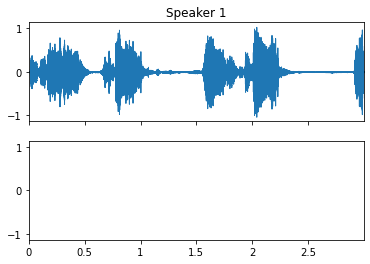

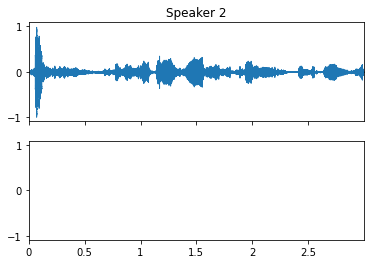

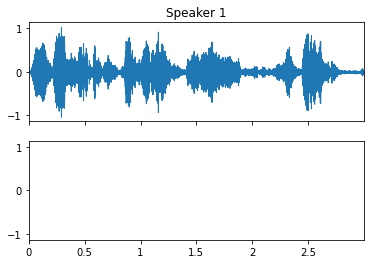

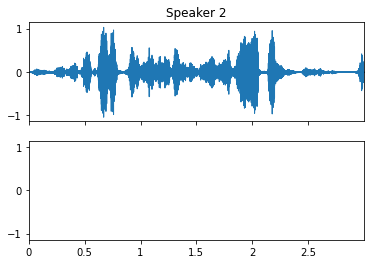

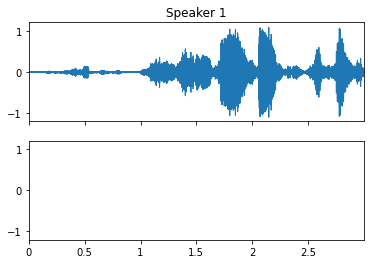

...

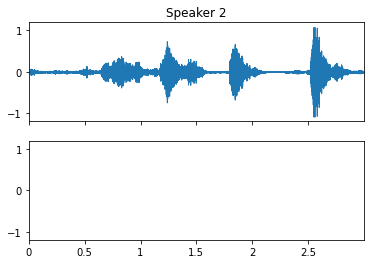

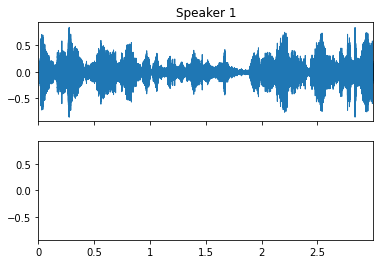

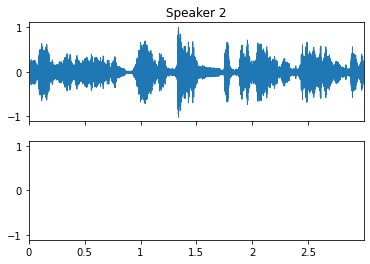

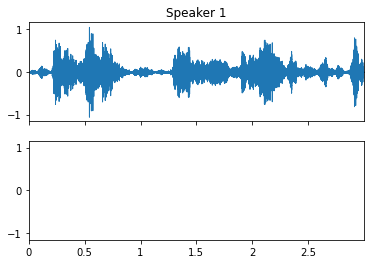

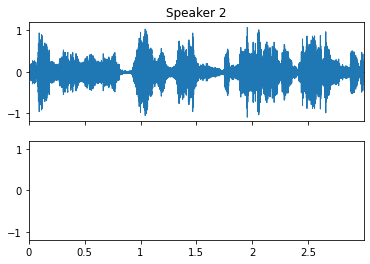

In [33]:
## evaluate the model and generate the prediction
import sys
sys.path.append('../lib')
from keras.models import load_model
from model.lib.model_ops import ModelMGPU
import os
import scipy.io.wavfile as wavfile
import numpy as np
import tensorflow as tf
import soundfile as sf
import IPython

# super parameters
people_num = 2
NUM_GPU = 1

# PATH 

model_path = '/content/drive/MyDrive/Xperi-Project/GoogleDataList/VideoModelDistance22.h5'
 
dir_path = '/content/speech_separation/pred1/'
if not os.path.isdir(dir_path):
    os.mkdir(dir_path)
database_path = './data/audio/AV_model_database/mix/'
face_path = './data/video/face_emb/'

# load data
testfiles = []

with open('./data/AV_log/AVdataset_val.txt', 'r') as f:
    testfiles = f.readlines()

def parse_X_data(line,num_people=people_num,database_path=database_path,face_path=face_path):
    parts = line.split() # get each name of file for one testset
    mix_str = parts[0]
    name_list = mix_str.replace('.npy','')
    name_list = name_list.replace('mix-','',1)
    names = name_list.split('-')
    single_idxs = []
    for i in range(num_people):
        single_idxs.append(names[i])
    file_path = database_path + mix_str
    mix = np.load(file_path)
    face_embs = np.zeros((1,75,1,171,num_people))
    for i in range(num_people):
        face_embs[0,:,:,:,i] = np.load(face_path+"%05d_face_emb.npy"%int(single_idxs[i]))

    return mix,single_idxs,face_embs


# predict data
AV_model = load_model(model_path,custom_objects={"tf": tf}, compile=False)
adam = optimizers.Adam()
AV_model.compile(optimizer=adam, loss='mse')

if NUM_GPU > 1:
    parallel_model = ModelMGPU(AV_model,NUM_GPU)
    for line in testfiles:
        mix,single_idxs,face_embs = parse_X_data(line)
        mix_expand = np.expand_dims(mix, axis=0)
        cRMs = parallel_model.predict([mix_expand,face_embs])
        cRMs = cRMs[0]
        prefix = ""
        for idx in single_idxs:
            prefix += idx + "-"
        for i in range(len(cRMs)):
            cRM = cRMs[:,:,:,i]
            assert cRM.shape == (298,257,2)
            F = utils.fast_icRM(mix,cRM)
            T = utils.fast_istft(F,power=False)
            filename = dir_path+prefix+str(single_idxs[i])+'.wav'
            sf.write(filename, T, 16000, subtype='PCM_24')


if NUM_GPU <= 1:
    for line in testfiles[0:10]:
        mix, single_idxs, face_embs = parse_X_data(line)
        mix_expand = np.expand_dims(mix, axis=0)
        cRMs = AV_model.predict([mix_expand, face_embs])
        cRMs = cRMs[0]
        prefix = ""
        for idx in single_idxs:
            prefix += idx + "-"
        for i in range(people_num):
            cRM = cRMs[:,:,:,i]
            assert cRM.shape == (298,257,2)
            F = utils.fast_icRM(mix,cRM)
            T = utils.fast_istft(F,power=False)
            filedisplay(T, 16000,i)
            filename = dir_path+prefix+single_idxs[i]+'.wav'
            sf.write(filename, T, 16000, subtype='PCM_24')
            IPython.display.display(IPython.display.Audio(filename))


In [ ]:
!rm -rf /content/speech_separation/pred1

In [ ]:
!rm -rf /content/speech_separation/pred1

In [ ]:
!pip install mir_eval
import mir_eval
from scipy.io import wavfile
y_wav ,samplerate = librosa.load('/content/speech_separation/data/audio/audio_train/trim_audio_train13.wav')
y_pred_wav ,samplerate= librosa.load('/content/speech_separation/pred1/00013-00069-00013.wav')
sdr, sir, sar, _ = mir_eval.separation.bss_eval_sources(y_wav, y_pred_wav)
print(sdr, sir, sar)
y_wav ,samplerate= librosa.load('/content/speech_separation/data/audio/audio_train/trim_audio_train69.wav')
y_pred_wav ,samplerate = librosa.load('/content/speech_separation/pred1/00013-00069-00069.wav')
sdr, sir, sar,_ = mir_eval.separation.bss_eval_sources(y_wav, y_pred_wav)
print(sdr, sir, sar)

     |████████████████████████████████| 90 kB 7.4 MB/s 
  Created wheel for mir-eval: filename=mir_eval-0.7-py3-none-any.whl size=100721 sha256=fea4a929230e360ad9cb8bc10fd91044d63e262744d3d2a57ff7ff35da0f0045
  Stored in directory: /root/.cache/pip/wheels/18/5a/46/d2527ff1fd975e1a793375e6ed763bfe4d3ea396b7cdc470eb
Successfully built mir-eval
[6.87674383] [inf] [6.87674383]
[0.98896201] [inf] [0.98896201]


In [20]:
from moviepy.editor import *
def showOutput(clip1,clip2,audio1,audio2):
    clip1 = VideoFileClip(clip1).subclip(0, 3)
    clip2 = VideoFileClip(clip2).subclip(0, 3)
    # list of clips
    clips = [[clip1, clip2]]
    final = clips_array(clips)
    audioclip1 = AudioFileClip(audio1).subclip(0, 3)
    audioclip2 = AudioFileClip(audio2).subclip(0, 3)
    videoclip1 = final.set_audio(audioclip1)
    videoclip2 = final.set_audio(audioclip2)
    videoclip1.write_videofile("vid1.mp4")
    videoclip2.write_videofile("vid2.mp4")


f1="13"
f2="69"
clip1="/content/speech_separation/data/video/video_train/"+f1+".mp4"
audio1="/content/speech_separation/pred1/000"+f1+"-000"+f2+"-000"+f1+".wav"
clip2="/content/speech_separation/data/video/video_train/"+f2+".mp4"
audio2="/content/speech_separation/pred1/000"+f1+"-000"+f2+"-000"+f2+".wav"

showOutput(clip1,clip2,audio1,audio2)



[MoviePy] >>>> Building video vid1.mp4
[MoviePy] Writing audio in vid1TEMP_MPY_wvf_snd.mp3


100%|██████████| 67/67 [00:00<00:00, 1082.16it/s]

[MoviePy] Done.
[MoviePy] Writing video vid1.mp4



100%|██████████| 90/90 [00:03<00:00, 28.80it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: vid1.mp4 

[MoviePy] >>>> Building video vid2.mp4
[MoviePy] Writing audio in vid2TEMP_MPY_wvf_snd.mp3


100%|██████████| 67/67 [00:00<00:00, 1196.61it/s]

[MoviePy] Done.
[MoviePy] Writing video vid2.mp4



100%|██████████| 90/90 [00:03<00:00, 26.88it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: vid2.mp4 



In [21]:
clip1 = VideoFileClip("vid1.mp4")
clip1.ipython_display(width = 480)

100%|██████████| 91/91 [00:01<00:00, 90.55it/s]


In [22]:
clip1 = VideoFileClip("vid2.mp4")
clip1.ipython_display(width = 480)

100%|██████████| 91/91 [00:01<00:00, 88.22it/s]


In [23]:
f1="23"
f2="82"
clip1="/content/speech_separation/data/video/video_train/"+f1+".mp4"
audio1="/content/speech_separation/pred1/000"+f1+"-000"+f2+"-000"+f1+".wav"
clip2="/content/speech_separation/data/video/video_train/"+f2+".mp4"
audio2="/content/speech_separation/pred1/000"+f1+"-000"+f2+"-000"+f2+".wav"

showOutput(clip1,clip2,audio1,audio2)



[MoviePy] >>>> Building video vid1.mp4
[MoviePy] Writing audio in vid1TEMP_MPY_wvf_snd.mp3


100%|██████████| 67/67 [00:00<00:00, 1122.96it/s]

[MoviePy] Done.
[MoviePy] Writing video vid1.mp4



100%|██████████| 90/90 [00:03<00:00, 28.61it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: vid1.mp4 

[MoviePy] >>>> Building video vid2.mp4
[MoviePy] Writing audio in vid2TEMP_MPY_wvf_snd.mp3


100%|██████████| 67/67 [00:00<00:00, 1165.15it/s]

[MoviePy] Done.
[MoviePy] Writing video vid2.mp4



100%|██████████| 90/90 [00:03<00:00, 26.63it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: vid2.mp4 



In [24]:
clip1 = VideoFileClip("vid1.mp4")
clip1.ipython_display(width = 480)

100%|██████████| 91/91 [00:00<00:00, 91.81it/s]


In [25]:
clip1 = VideoFileClip("vid2.mp4")
clip1.ipython_display(width = 480)

100%|██████████| 91/91 [00:00<00:00, 95.43it/s]


In [ ]:
def videoData(file):
    cap = cv2.VideoCapture(0)
    # Set mediapipe model
    lips = [61, 185, 40, 39, 37, 267, 269, 270, 409, 291,375, 321, 405, 314, 84,181, 91, 146,0]
    index=0
    vis_data=[]
    p=0
    status= True
    vis_dist=[]
    detector = MTCNN()
    with mp_holistic.Holistic(min_detection_confidence=0.5, min_tracking_confidence=0.5) as holistic:
        while cap.isOpened():

            # Read feed
            ret, frame = cap.read()

            # Make detections
            try:
                img = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
                if(p==0):
                    a=detector.detect_faces(img)
                    p=1
                if(len(a)!=1):
                    status=False
                    print("too many faces")
                    break
                image, results = mediapipe_detection(frame, holistic)
            except:
                status=False
                print("Frame missing",i)
                return status,vis_data,vis_dist
#                 break
            keypoints = extract_keypoints(results)
            if all(v == 0 for v in keypoints):
                status=False

            dist_vector=[]
            k=keypoints
            for i in range(len(lips)):
                p1 = np.array([k[lips[i]*3], k[lips[i]*3+1],k[lips[i]*3+2]])
#                 print(p1)
                for j in range(i+1,len(lips)):
                    p2 = np.array([k[lips[j]*3], k[lips[j]*3+1],k[lips[j]*3+2]])
                    squared_dist = np.sum((p1-p2)**2, axis=0)
                    dist = np.sqrt(squared_dist)
                    dist_vector.append(dist)
                    
            dist_vector=np.array(dist_vector)
            dist_vector_normalized = (dist_vector - np.min(dist_vector))/np.ptp(dist_vector)
            
            vis_dist.append(dist_vector_normalized)
            vis_data.append(keypoints)
            index+=1
            draw_styled_landmarks(image, results)
            if(index==75):
                break

#             Show to screen
            cv2.imshow('OpenCV Feed', image)
#             Break gracefully
            if cv2.waitKey(10) & 0xFF == ord('q'):
                break
        cap.release()
        cv2.destroyAllWindows()
        return status,vis_data,np.array(vis_dist)



status,data,vis_dist= videoData("/content/speech_separation/data/video/video_train/1.mp4")
status

True

In [ ]:
import glob
from tqdm.notebook import tqdm
# All files and directories ending with .txt and that don't begin with a dot:
a=(glob.glob("/content/speech_separation/data/video/video_train/*.mp4")) 
# a=(glob.glob("C:\\Users\\schakraborty\\Documents\\2.SelfExperiment/*.mp4"))
len(a)

75

In [ ]:
badFiles =[]

fal=0

for i in tqdm(a):
    status,data,vis_dist= videoData(i)
    if(status=='False'):
        fal+=1
    print(status,i)
    
    if(status == True):
        fname=i.replace(".mp4","_vid.npy")
#         np.save(fname,data)
    else:
#         badFiles.append(i)
        file1 = open("badvideos.txt", "a")  # append mode
        file1.write(i+"\n")
        file1.close()

  0%|          | 0/75 [00:00<?, ?it/s]

True /content/speech_separation/data/video/video_train/54.mp4
True /content/speech_separation/data/video/video_train/73.mp4
True /content/speech_separation/data/video/video_train/33.mp4
True /content/speech_separation/data/video/video_train/56.mp4
True /content/speech_separation/data/video/video_train/21.mp4
True /content/speech_separation/data/video/video_train/61.mp4
True /content/speech_separation/data/video/video_train/75.mp4
True /content/speech_separation/data/video/video_train/34.mp4
True /content/speech_separation/data/video/video_train/23.mp4
True /content/speech_separation/data/video/video_train/26.mp4
True /content/speech_separation/data/video/video_train/45.mp4
True /content/speech_separation/data/video/video_train/31.mp4
True /content/speech_separation/data/video/video_train/66.mp4
True /content/speech_separation/data/video/video_train/9.mp4
True /content/speech_separation/data/video/video_train/83.mp4
True /content/speech_separation/data/video/video_train/69.mp4
True /con

KeyboardInterrupt: ignored